In [1]:
import pandas as pd
import numpy as np
from tqdm import tqdm
import os

import nibabel as nib
import nilearn as nl
import nilearn.plotting as nlplt

import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib import cm
import matplotlib.animation as anim

import imageio
from skimage.transform import resize
from skimage.util import montage

from IPython.display import Image as show_gif
import ipywidgets as widgets

import warnings

warnings.simplefilter("ignore")

In [51]:
class ImageToGIF:
    """Create GIF without saving image files."""

    def __init__(self, size=(600, 400), xy_text=(80, 10), dpi=100, cmap="CMRmap"):
        self.fig = plt.figure()
        self.fig.set_size_inches(size[0] / dpi, size[1] / dpi)
        self.xy_text = xy_text
        self.cmap = cmap

        self.ax = self.fig.add_axes([0, 0, 1, 1])
        self.ax.set_xticks([])
        self.ax.set_yticks([])
        self.images = []

    def add(self, *args, label, with_mask=True):
        image = args[0]
        mask = args[-1]
        plt.set_cmap(self.cmap)
        plt_img = self.ax.imshow(image, animated=True)
        if with_mask:
            plt_mask = self.ax.imshow(
                np.ma.masked_where(mask == False, mask), alpha=0.7, animated=True
            )

        plt_text = self.ax.text(*self.xy_text, label, color="red")
        to_plot = [plt_img, plt_mask, plt_text] if with_mask else [plt_img, plt_text]
        self.images.append(to_plot)
        plt.close()

    def save(self, filename, fps):
        animation = anim.ArtistAnimation(self.fig, self.images)
        animation.save(filename, writer="imagemagick", fps=fps)


class Image3dToGIF3d:
    """
    Displaying 3D images in 3d axes.
    Parameters:
        img_dim: shape of cube for resizing.
        figsize: figure size for plotting in inches.
    """

    def __init__(
        self,
        img_dim: tuple = (55, 55, 55),
        figsize: tuple = (15, 10),
    ):
        """Initialization."""
        self.img_dim = img_dim
        print(img_dim)
        self.figsize = figsize

    def _explode(self, data: np.ndarray):
        """
        Takes: array and return an array twice as large in each dimension,
        with an extra space between each voxel.
        """
        shape_arr = np.array(data.shape)
        size = shape_arr[:3] * 2 - 1
        exploded = np.zeros(np.concatenate([size, shape_arr[3:]]), dtype=data.dtype)
        exploded[::2, ::2, ::2] = data
        return exploded

    def _expand_coordinates(self, indices: np.ndarray):
        x, y, z = indices
        x[1::2, :, :] += 1
        y[:, 1::2, :] += 1
        z[:, :, 1::2] += 1
        return x, y, z

    def _normalize(self, arr: np.ndarray):
        """Normilize image value between 0 and 1."""
        return arr / arr.max()

    def _scale_by(self, arr: np.ndarray, factor: int):
        """
        Scale 3d Image to factor.
        Parameters:
            arr: 3d image for scalling.
            factor: factor for scalling.
        """
        mean = np.mean(arr)
        return (arr - mean) * factor + mean

    def get_transformed_data(self, data: np.ndarray):
        """Data transformation: normalization, scaling, resizing."""
        norm_data = np.clip(self._normalize(data) - 0.1, 0, 1) ** 0.4
        scaled_data = np.clip(self._scale_by(norm_data, 2) - 0.1, 0, 1)
        resized_data = resize(scaled_data, self.img_dim, mode="constant")
        return resized_data

    def plot_cube(
        self,
        cube,
        title: str = "",
        init_angle: int = 0,
        make_gif: bool = False,
        path_to_save: str = "filename.gif",
    ):
        """
        Plot 3d data.
        Parameters:
            cube: 3d data
            title: title for figure.
            init_angle: angle for image plot (from 0-360).
            make_gif: if True create gif from every 5th frames from 3d image plot.
            path_to_save: path to save GIF file.
        """
        cube = self._normalize(cube)

        facecolors = cm.gist_stern(cube)
        facecolors[:, :, :, -1] = cube
        facecolors = self._explode(facecolors)

        filled = facecolors[:, :, :, -1] != 0
        x, y, z = self._expand_coordinates(np.indices(np.array(filled.shape) + 1))

        with plt.style.context("dark_background"):
            fig = plt.figure(figsize=self.figsize)
            ax = fig.gca(projection="3d")

            ax.view_init(30, init_angle)
            ax.set_xlim(right=self.img_dim[0] * 2)
            ax.set_ylim(top=self.img_dim[1] * 2)
            ax.set_zlim(top=self.img_dim[2] * 2)
            ax.set_title(title, fontsize=18, y=1.05)

            ax.voxels(x, y, z, filled, facecolors=facecolors, shade=False)

            if make_gif:
                images = []
                for angle in tqdm(range(0, 360, 5)):
                    ax.view_init(30, angle)
                    fname = str(angle) + ".png"

                    plt.savefig(fname, dpi=120, format="png", bbox_inches="tight")
                    images.append(imageio.imread(fname))
                    # os.remove(fname)
                imageio.mimsave(path_to_save, images)
                plt.close()

            else:
                plt.show()

## TrainValid


In [2]:
trainVal = pd.read_csv("../data/TrainValid_split.csv")
pd.set_option("display.max_colwidth", None)
trainVal.head()

,id,scan-level label,group
0,Zx00AD16F8B97A53DE6E7CFE260BDF122F0E655659A3DF1628,1,Train
1,Zx00FE1B9A88E88C71CF81D0736F23E88BB9C35E2BCDECF501,0,Train
2,Zx00FE1B9A88E88C71F8D11F50C2B5FBFEB3461E67BE1E83B8,0,Train
3,Zx014E4DF04789E7E61C3B4876CE4D122DC14E0BB842E42E7D,0,Train
4,Zx016CBC4284052F6A74A56DAFFB0B39B95D4DEC066028AA4A,1,Train


### 資料 train, valid 分配


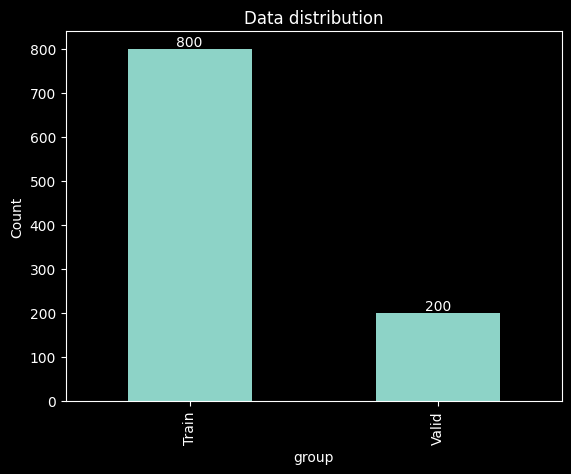

In [3]:
ax = trainVal["group"].value_counts().plot(kind="bar")
ax.set_title("Data distribution")
ax.set_ylabel("Count")
for p in ax.patches:
    ax.annotate(
        str(p.get_height()),
        (p.get_x() + p.get_width() / 2, p.get_height()),
        ha="center",
        va="bottom",
    )

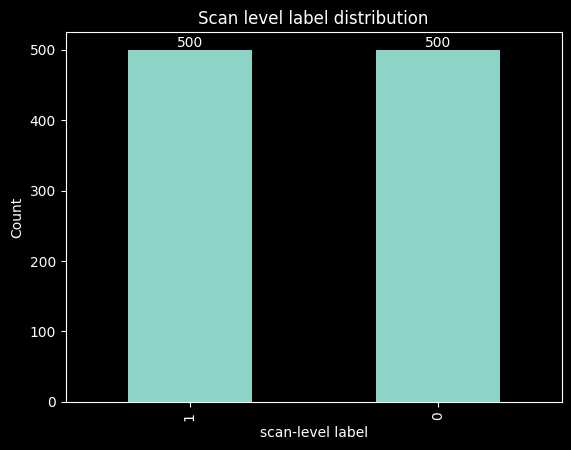

In [68]:
ax = trainVal["scan-level label"].value_counts().plot(kind="bar")
ax.set_title("Scan level label distribution")
ax.set_ylabel("Count")
for p in ax.patches:
    ax.annotate(
        str(p.get_height()),
        (p.get_x() + p.get_width() / 2, p.get_height()),
        ha="center",
        va="bottom",
    )

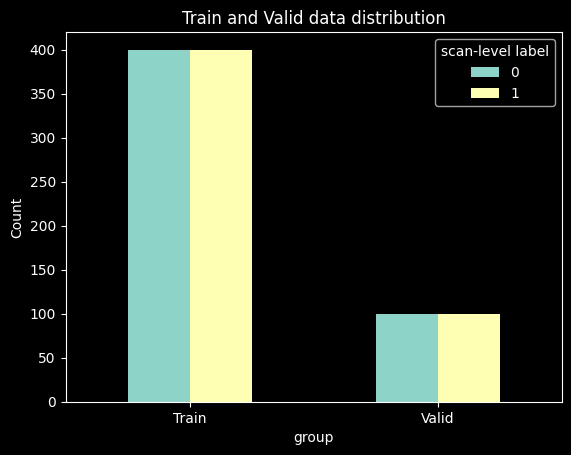

In [70]:
# plot how many lavel 1, 0 in group Train and Valid seperately
trainVal.groupby(["group", "scan-level label"]).size().unstack().plot(kind="bar")
plt.title("Train and Valid data distribution")
plt.ylabel("Count")
plt.xticks(rotation=0)
plt.show()

In [4]:
trainValGround = pd.read_csv("../data/TrainValid_ground_truth.csv")

trainVal["true_count"] = 0
trainVal["false_count"] = 0

for id in trainVal["id"]:
    labels = trainValGround[trainValGround["id"].str.contains(rf"{id}_.*", regex=True)][
        "label"
    ].tolist()
    trainVal.loc[trainVal["id"] == id, "true_count"] = labels.count(1)
    trainVal.loc[trainVal["id"] == id, "false_count"] = labels.count(0)

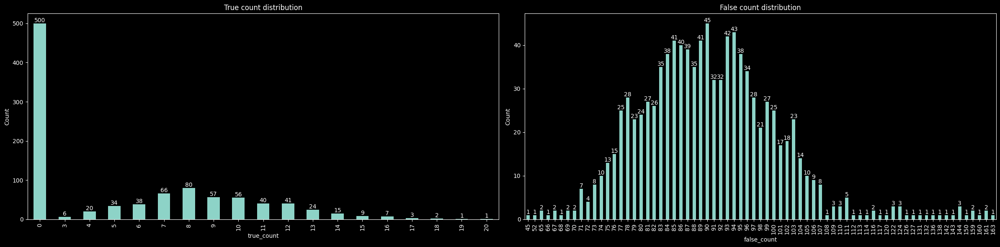

In [5]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 6))

# Plot for true_count
ax1 = trainVal["true_count"].value_counts().sort_index().plot(kind="bar", ax=ax1)
ax1.set_title("True count distribution")
ax1.set_ylabel("Count")
for p in ax1.patches:
    ax1.annotate(
        str(p.get_height()),
        (p.get_x() + p.get_width() / 2, p.get_height()),
        ha="center",
        va="bottom",
    )

# Plot for false_count
ax2 = trainVal["false_count"].value_counts().sort_index().plot(kind="bar", ax=ax2)
ax2.set_title("False count distribution")
ax2.set_ylabel("Count")
for p in ax2.patches:
    ax2.annotate(
        str(p.get_height()),
        (p.get_x() + p.get_width() / 2, p.get_height()),
        ha="center",
        va="bottom",
    )

plt.tight_layout()
plt.show()

In [90]:
trainVal["true_count_p"] = 0
trainVal["false_count_p"] = 0

for id in trainVal["id"]:
    labels = trainValGround[trainValGround["id"].str.contains(rf"{id}_([1-4]\d|5[0-1])$", regex=True)][
        "label"
    ].tolist()
    trainVal.loc[trainVal["id"] == id, "true_count_p"] = labels.count(1)
    trainVal.loc[trainVal["id"] == id, "false_count_p"] = labels.count(0)

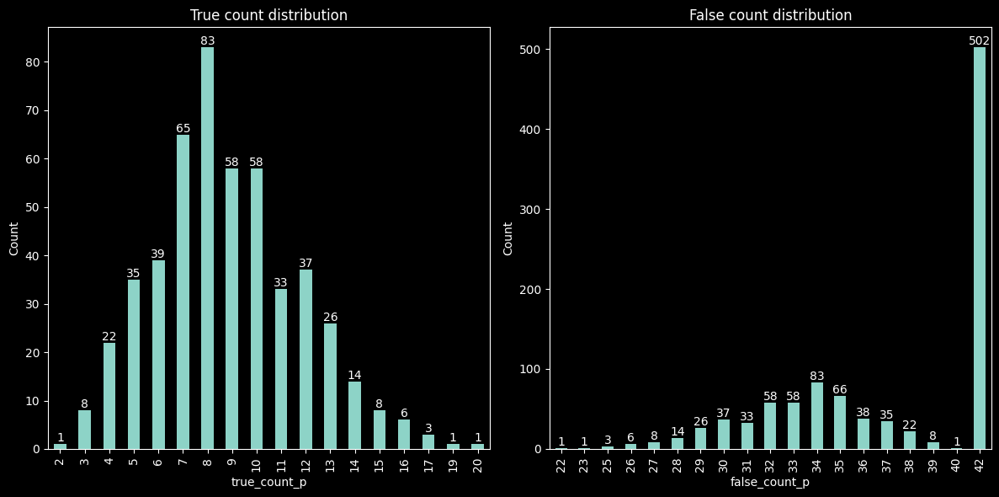

In [91]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

# Plot for true_count
ax1 = trainVal[trainVal["true_count_p"] != 0]["true_count_p"].value_counts().sort_index().plot(kind="bar", ax=ax1)
ax1.set_title("True count distribution")
ax1.set_ylabel("Count")
for p in ax1.patches:
    ax1.annotate(
        str(p.get_height()),
        (p.get_x() + p.get_width() / 2, p.get_height()),
        ha="center",
        va="bottom",
    )

# Plot for false_count
ax2 = trainVal[trainVal["false_count_p"] != 0]["false_count_p"].value_counts().sort_index().plot(kind="bar", ax=ax2)
ax2.set_title("False count distribution")
ax2.set_ylabel("Count")
for p in ax2.patches:
    ax2.annotate(
        str(p.get_height()),
        (p.get_x() + p.get_width() / 2, p.get_height()),
        ha="center",
        va="bottom",
    )

plt.tight_layout()
plt.show()

In [7]:
print("Total number samples:", len(trainVal))
print("Number train samples:", len(trainVal[trainVal["group"] == "Train"].index))
print("Number test samples:", len(trainVal[trainVal["group"] == "Valid"].index))

Total number samples: 1000
Number train samples: 800
Number test samples: 200


## Ground Truth


load dataset


In [56]:
trainValGround = pd.read_csv("../data/TrainValid_ground_truth.csv")
pd.set_option("display.max_colwidth", None)
trainValGround.head()

,id,label
0,Zx00AD16F8B97A53DE6E7CFE260BDF122F0E655659A3DF1628,1
1,Zx00AD16F8B97A53DE6E7CFE260BDF122F0E655659A3DF1628_0,0
2,Zx00AD16F8B97A53DE6E7CFE260BDF122F0E655659A3DF1628_1,0
3,Zx00AD16F8B97A53DE6E7CFE260BDF122F0E655659A3DF1628_2,0
4,Zx00AD16F8B97A53DE6E7CFE260BDF122F0E655659A3DF1628_3,0


### 資料 train, valid 分配


<Axes: xlabel='label'>

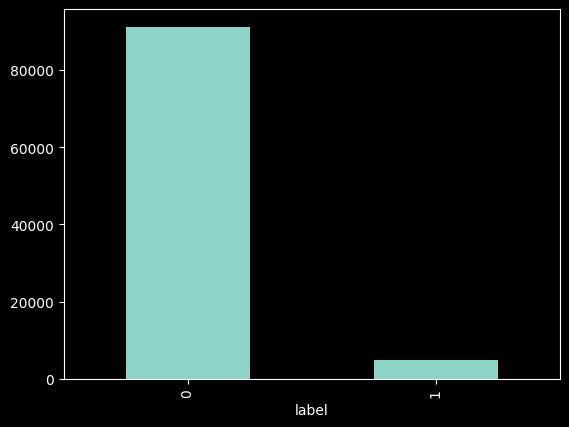

In [57]:
trainValGround["label"].value_counts().plot(kind="bar")

In [58]:
print("Total number samples:", len(trainValGround))

Total number samples: 96203


## Visualize


load gz is slower than nii for about 0.5sec/file


In [5]:
filepath = f"../data/1_Train,Valid_Image/{trainVal['id'][0]}.nii.gz"
filepath_mask = f"../data/2_Train,Valid_Mask/{trainVal['id'][0]}_label.nii.gz"

print("Visualizing Sample:", filepath)
sample_img = nib.load(filepath)
sample_img = np.asanyarray(sample_img.dataobj)
sample_mask = nib.load(filepath_mask)
sample_mask = np.asanyarray(sample_mask.dataobj)
print("img shape ->", sample_img.shape)
print("mask shape ->", sample_mask.shape)

Visualizing Sample: ../data/1_Train,Valid_Image/Zx00AD16F8B97A53DE6E7CFE260BDF122F0E655659A3DF1628.nii.gz
img shape -> (512, 512, 90)
mask shape -> (512, 512, 90)


In [8]:
def show_slice(slice_n):
    plt.clf()
    slice_n = slice_n.new
    font_size = 14
    fig, ax = plt.subplots(2, 3, figsize=(20, 10))
    fig.tight_layout()

    ax[0, 0].imshow(sample_img[slice_n, :, :], cmap="gray")
    ax[0, 0].set_title(
        f"image slice number {slice_n} along the x-axis", fontsize=font_size, color="r"
    )
    ax[1, 0].imshow(sample_mask[slice_n, :, :], cmap="gray")
    ax[1, 0].set_title(
        f"mask slice {slice_n} along the x-axis", fontsize=font_size, color="r"
    )

    ax[0, 1].imshow(sample_img[:, slice_n, :], cmap="gray")
    ax[0, 1].set_title(
        f"image slice number {slice_n} along the y-axis", fontsize=font_size, color="r"
    )
    ax[1, 1].imshow(sample_mask[:, slice_n, :], cmap="gray")
    ax[1, 1].set_title(
        f"mask slice number {slice_n} along the y-axis", fontsize=font_size, color="r"
    )

    ax[0, 2].imshow(sample_img[:, :, slice_n], cmap="gray")
    ax[0, 2].set_title(
        f"image slice number {slice_n} along the z-axis", fontsize=font_size, color="r"
    )
    ax[1, 2].imshow(sample_mask[:, :, slice_n], cmap="gray")
    ax[1, 2].set_title(
        f"mask slice number {slice_n} along the z-axis", fontsize=font_size, color="r"
    )
    fig.tight_layout()
    plt.show()


slider = widgets.IntSlider(
    value=0,
    min=0,
    max=sample_img.shape[2],
    step=1,
    description="Slice:",
    disabled=False,
    continuous_update=False,
    orientation="horizontal",
    readout=True,
    readout_format="d",
)
slider.observe(show_slice, names="value")
display(slider)

NameError: name 'sample_img' is not defined

## Animation


MovieWriter imagemagick unavailable; using Pillow instead.


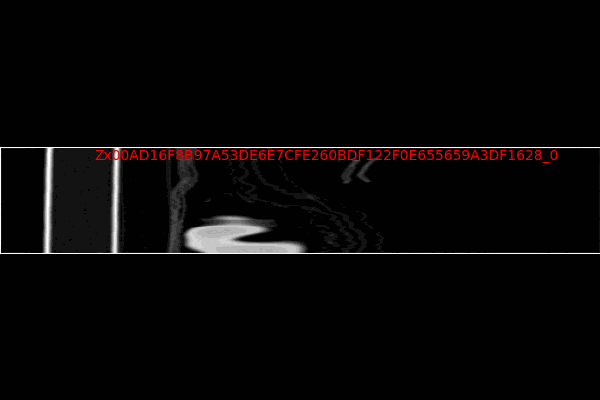

In [26]:
sample_data_gif = ImageToGIF(cmap="gray")
filename = f"{trainVal['id'][0]}_3d_2d.gif"

for i in range(sample_img.shape[0]):
    image = np.rot90(sample_img[i])  # 逆時鐘轉90度
    mask = np.clip(np.rot90(sample_mask[i]), 0, 1)
    sample_data_gif.add(image, mask, label=f"{trainVal['id'][0]}_{str(i)}")

sample_data_gif.save(filename, fps=15)
show_gif(filename, format="png")

TypeError: FigureCanvasAgg.print_png() got an unexpected keyword argument 'pad_iches'

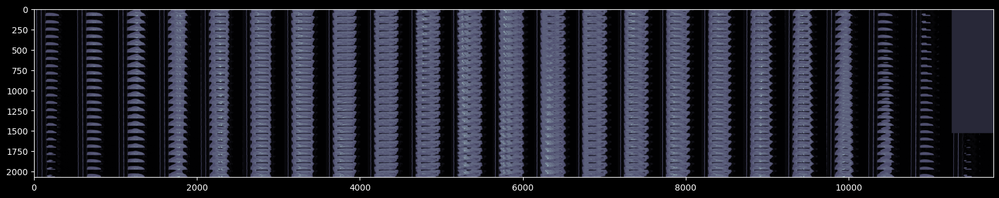

In [27]:
image = np.rot90(montage(sample_img))
mask = np.rot90(montage(sample_mask))
mask = np.clip(mask, 0, 1)

fig, ax1 = plt.subplots(1, 1, figsize=(20, 30))
ax1.imshow(image, cmap="bone")
ax1.imshow(
    np.ma.masked_where(mask == False, mask), cmap="gray", alpha=0.6, animated=True
)
fig.savefig(
    f"{trainVal['id'][0]}_3d_to_2d.png",
    format="png",
    bbox_inches="tight",
    pad_iches=0.0,
)

#### 3D


In [ ]:
%%time
filename = f"{trainVal['id'][0]}_3d.gif"

data_to_3dgif = Image3dToGIF3d()
transformed_data = data_to_3dgif.get_transformed_data(sample_img)
data_to_3dgif.plot_cube(
    transformed_data[:38, :47, :35],#[:77, :105, :55]
    title=trainVal['id'][0],
    make_gif=True,
    path_to_save=filename
)
show_gif(filename, format='png')

### visualization with nilearn


In [ ]:
niimg = nl.image.load_img(filepath)
nimask = nl.image.load_img(filepath_mask)

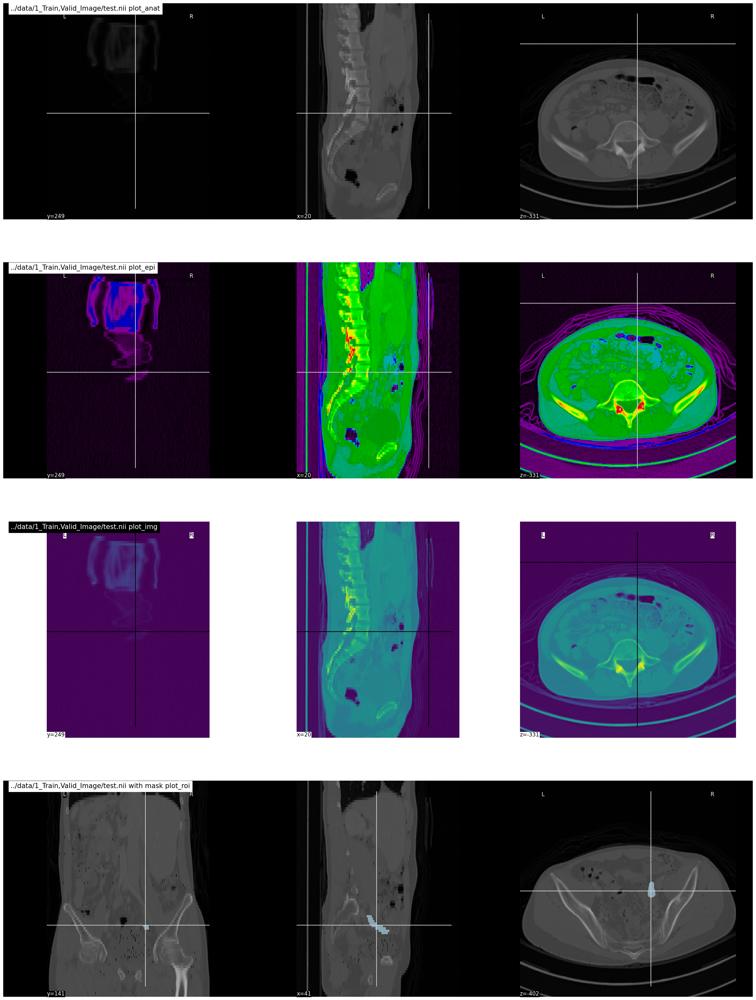

In [ ]:
fig, axes = plt.subplots(nrows=4, figsize=(30, 40))


nlplt.plot_anat(niimg, title=f"{filepath} plot_anat", axes=axes[0])

nlplt.plot_epi(niimg, title=f"{filepath} plot_epi", axes=axes[1])

nlplt.plot_img(niimg, title=f"{filepath} plot_img", axes=axes[2])

nlplt.plot_roi(
    nimask,
    title=f"{filepath} with mask plot_roi",
    bg_img=niimg,
    axes=axes[3],
    cmap="Paired",
)

plt.show()

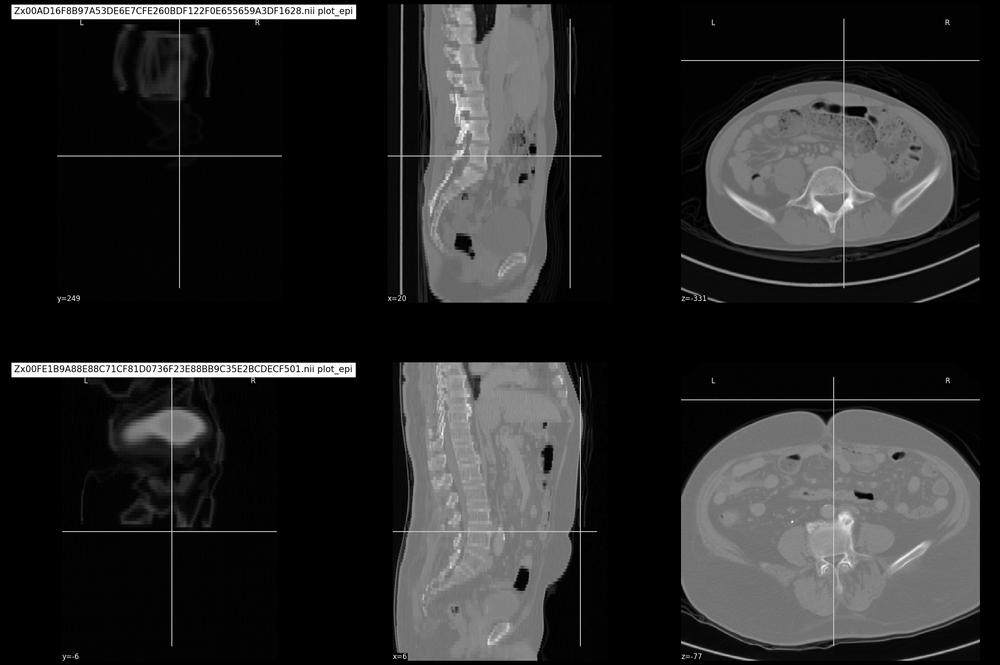

In [ ]:
t1_niimg = nl.image.load_img(f"../data/1_Train,Valid_Image/{trainVal['id'][0]}.nii")
t2_niimg = nl.image.load_img(f"../data/1_Train,Valid_Image/{trainVal['id'][1]}.nii")

fig, axes = plt.subplots(nrows=2, figsize=(30, 20))

nlplt.plot_epi(
    t1_niimg, title=f"{trainVal['id'][0]}.nii plot_epi", axes=axes[0], cmap="gray"
)
nlplt.plot_epi(
    t2_niimg, title=f"{trainVal['id'][1]}.nii plot_epi", axes=axes[1], cmap="gray"
)
plt.show()

#### Data shapes


In [ ]:
for id in trainVal["id"][:5]:
    filepath = f"../data/1_Train,Valid_Image/{id}.nii"
    filepath_mask = f"../data/2_Train,Valid_Mask/{id}_label.nii"

    # print("Visualizing Sample:", filepath)
    sample_img = nib.load(filepath)
    sample_img = np.asanyarray(sample_img.dataobj)
    sample_mask = nib.load(filepath_mask)
    sample_mask = np.asanyarray(sample_mask.dataobj)
    print("ID ->", id)
    print("img shape ->", sample_img.shape)
    print("mask shape ->", sample_mask.shape)

ID -> Zx00AD16F8B97A53DE6E7CFE260BDF122F0E655659A3DF1628
img shape -> (512, 512, 90)
mask shape -> (512, 512, 90)
ID -> Zx00FE1B9A88E88C71CF81D0736F23E88BB9C35E2BCDECF501
img shape -> (512, 512, 94)
mask shape -> (512, 512, 94)
ID -> Zx00FE1B9A88E88C71F8D11F50C2B5FBFEB3461E67BE1E83B8
img shape -> (512, 512, 102)
mask shape -> (512, 512, 102)
ID -> Zx014E4DF04789E7E61C3B4876CE4D122DC14E0BB842E42E7D
img shape -> (512, 512, 109)
mask shape -> (512, 512, 109)
ID -> Zx016CBC4284052F6A74A56DAFFB0B39B95D4DEC066028AA4A
img shape -> (512, 512, 97)
mask shape -> (512, 512, 97)


### View Z-axis with masks


ID: Zx00AD16F8B97A53DE6E7CFE260BDF122F0E655659A3DF1628


In [23]:
filepath = f"../data/1_Train,Valid_Image/Zx00AD16F8B97A53DE6E7CFE260BDF122F0E655659A3DF1628.nii.gz"
filepath_mask = f"../data/2_Train,Valid_Mask/Zx00AD16F8B97A53DE6E7CFE260BDF122F0E655659A3DF1628_label.nii.gz"


# shape again

sample_img = nib.load(filepath)
sample_img = np.asanyarray(sample_img.dataobj)
sample_mask = nib.load(filepath_mask)
sample_mask = np.asanyarray(sample_mask.dataobj)

print("mask shape ->", sample_mask.shape)
print("img shape ->", sample_img.shape)

mask shape -> (512, 512, 90)
img shape -> (512, 512, 90)


In [11]:
mask_only_gif = ImageToGIF(cmap="gray")
filename = f"Zx00AD16F8B97A53DE6E7CFE260BDF122F0E655659A3DF1628_mask_2d_z_axis.gif"

for i in range(sample_img.shape[2]):
    # image = sample_img[:,:,i]
    mask = np.where(sample_mask[:, :, i] != 0, 255, 0)
    mask_only_gif.add(mask, label=f"mask_{str(i)}")

mask_only_gif.save(filename, fps=5)
show_gif(filename, format="png")

NameError: name 'ImageToGIF' is not defined

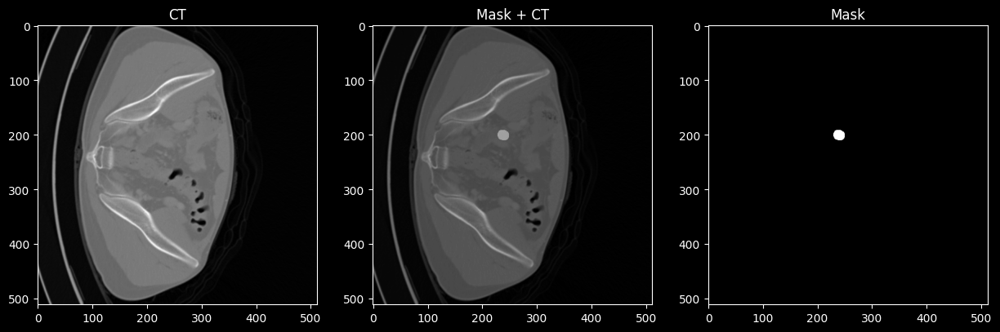

In [25]:
image = sample_img[:, :, 30]
mask = np.where(sample_mask[:, :, 30] != 0, 255, 0)

# bounding box
zero_pixels = np.where(mask == 255)
min_y, min_x = np.min(zero_pixels, axis=1)
max_y, max_x = np.max(zero_pixels, axis=1)
rect = patches.Rectangle(
    (min_x, min_y),
    max_x - min_x,
    max_y - min_y,
    linewidth=1,
    edgecolor="r",
    facecolor="none",
)


fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 5))

ax1.imshow(image, cmap="gray")
ax1.set_title("CT")

ax2.imshow(image, cmap="gray", alpha=1)
ax2.imshow(mask, cmap="gray", alpha=0.3)
ax2.set_title("Mask + CT")

ax3.imshow(mask, cmap="gray")
#ax3.add_patch(rect)
ax3.set_title("Mask")

plt.show()

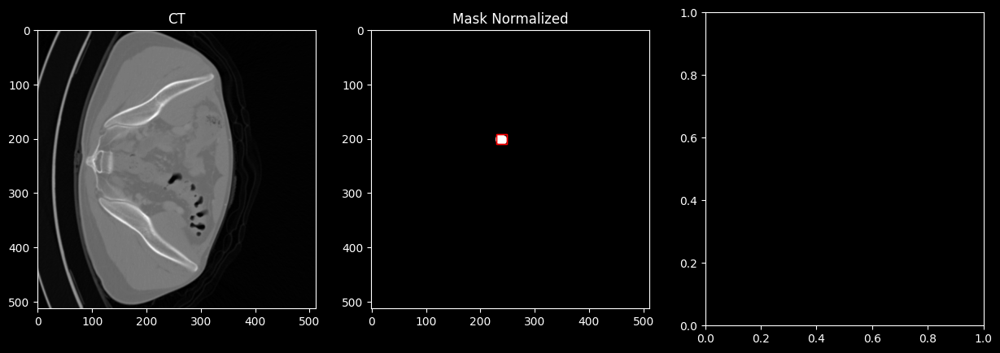

In [15]:
def normalize(sample, WL=45, WW=300):
    """Normalize the volume"""
    CT_min = WL + WW / 2
    CT_max = WL + WW / 2

    # sample = (sample - CT_min) / (CT_max - CT_min)
    # sample[sample > 1] = 1.0
    # sample[sample < 0] = 0.0

    sample[sample < CT_min] = CT_min
    sample[sample < CT_max] = CT_max

    return sample


mask_n = normalize(mask)

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 5))
rect = patches.Rectangle(
    (min_x, min_y),
    max_x - min_x,
    max_y - min_y,
    linewidth=1,
    edgecolor="r",
    facecolor="none",
)

ax1.imshow(image, cmap="gray")
ax1.set_title("CT")

ax2.imshow(mask, cmap="gray")
ax2.add_patch(rect)
ax2.set_title("Mask")

ax2.imshow(mask_n, cmap="gray")
ax2.add_patch(rect)
ax2.set_title("Mask Normalized")

plt.show()

### Stack


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


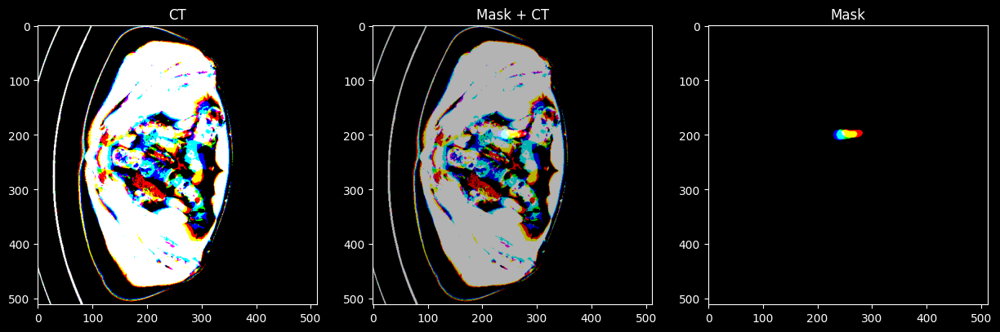

In [31]:
image = sample_img[:, :, 28:31]
mask = np.where(sample_mask[:, :, 28:31] != 0, 255, 0)

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 5))

ax1.imshow(image, cmap="gray")
ax1.set_title("CT")

ax2.imshow(image, cmap="gray", alpha=1)
ax2.imshow(mask, cmap="gray", alpha=0.3)
ax2.set_title("Mask + CT")

ax3.imshow(mask, cmap="gray")
ax3.set_title("Mask")

plt.show()

### Does every case have a corresponding mask file? Ans: Yes


In [32]:
label_count = 0
for id in trainVal["id"]:
    filepath_mask = f"../data/2_Train,Valid_Mask/{id}_label.nii"
    if os.path.exists(filepath_mask):
        label_count += 1

print(f"label / total -> {label_count}/{len(trainVal['id'])}")

label / total -> 0/1000


### Are there any empty mask? Yes, corresponding with label.


In [33]:
has_value = 0
corresponding_value = 0

for idx, id in enumerate(trainVal["id"]):
    filepath_mask = f"../data/2_Train,Valid_Mask/{id}_label.nii.gz"
    mask = nib.load(filepath_mask)
    mask = np.asanyarray(mask.dataobj)

    if np.any(mask != 0):
        has_value += 1

        if trainVal["scan-level label"][idx] == 1:
            corresponding_value += 1
    else:
        if trainVal["scan-level label"][idx] == 0:
            corresponding_value += 1

print(f"has value / total -> {has_value}/{len(trainVal['id'])}")
print(f"corresponding with label -> {corresponding_value}")

has value / total -> 500/1000
corresponding with label -> 1000


In [6]:
slice_count = []
min_y_s = []
max_y_s = []
min_x_s = []
max_x_s = []

for idx, id in tqdm(enumerate(trainVal["id"])):
    filepath_mask = f"../data/2_Train,Valid_Mask/{id}_label.nii.gz"
    mask = nib.load(filepath_mask)
    mask = np.asanyarray(mask.dataobj)

    slice_count.append(mask.shape[2])
    for slice_i in range(mask.shape[2]):
        zero_pixels = np.where(mask[:, :, slice_i] != 0)
        if len(zero_pixels[0]) == 0:
            continue
        min_y, min_x = np.min(zero_pixels, axis=1)
        max_y, max_x = np.max(zero_pixels, axis=1)

        min_y_s.append(min_y)
        max_y_s.append(max_y)
        min_x_s.append(min_x)
        max_x_s.append(max_x)

1000it [02:22,  7.03it/s]


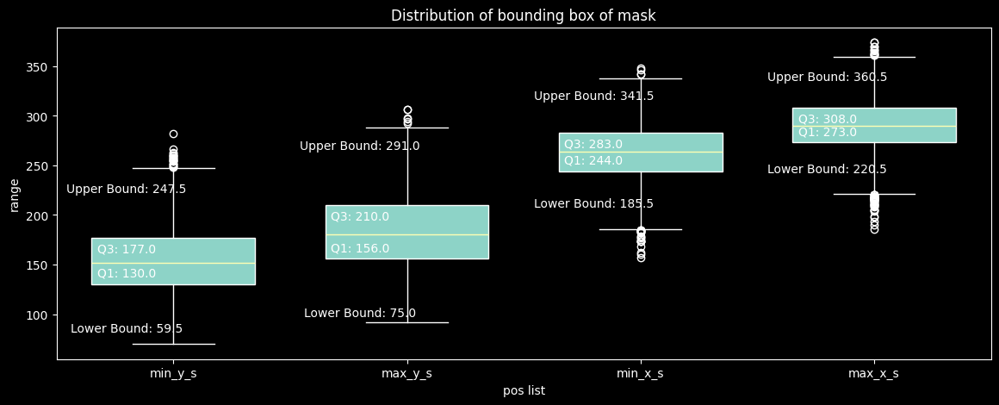

In [19]:
plt.figure(figsize=(14, 5))

plt.boxplot(
    [min_y_s, max_y_s, min_x_s, max_x_s],
    vert=True,
    widths=0.7,
    patch_artist=True,
    labels=["min_y_s", "max_y_s", "min_x_s", "max_x_s"],
)

# Add labels and title
plt.xlabel("pos list")
plt.ylabel("range")
plt.title("Distribution of bounding box of mask")

off = 0.8
for idx, pos_list in enumerate([min_y_s, max_y_s, min_x_s, max_x_s]):
    # Calculate quartiles and bounds
    q1 = np.percentile(pos_list, 25)
    q3 = np.percentile(pos_list, 75)
    lower_bound = q1 - 1.5 * (q3 - q1)
    upper_bound = q3 + 1.5 * (q3 - q1)

    plt.text(idx + off, q1 + 5, f"Q1: {q1}", ha="center", va="bottom")
    plt.text(idx + off, q3 - 5, f"Q3: {q3}", ha="center", va="top")
    plt.text(
        idx + off,
        lower_bound + 20,
        f"Lower Bound: {lower_bound}",
        ha="center",
        va="bottom",
    )
    plt.text(
        idx + off,
        upper_bound - 15,
        f"Upper Bound: {upper_bound}",
        ha="center",
        va="top",
    )

    # Plot median and mean
    median = np.median(pos_list)
    mean = np.mean(pos_list)

# plt.legend()
plt.show()

### How many outliers? Max offset is?


In [36]:
def count_outliers(dataset):
    q1, q3 = np.percentile(dataset, [25, 75])
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    u_outliers = [value for value in dataset if value > upper_bound]
    l_outliers = [value for value in dataset if value < lower_bound]
    return (
        len(u_outliers),
        len(l_outliers),
        max(dataset) - upper_bound,
        lower_bound - min(dataset),
    )


outliers_counts = [
    count_outliers(dataset) for dataset in [min_y_s, max_y_s, min_x_s, max_x_s]
]
outliers_counts

[(23, 0, 34.5, -10.5),
 (6, 0, 15.0, -17.0),
 (4, 21, 6.5, 28.5),
 (13, 46, 13.5, 34.5)]

### Number of outliers with slice scale


In [37]:
q1q3 = [
    np.percentile(dataset, [25, 75]) for dataset in [min_y_s, max_y_s, min_x_s, max_x_s]
]
lower_bounds = [q1 - 1.5 * (q3 - q1) for q1, q3 in q1q3]
upper_bounds = [q3 + 1.5 * (q3 - q1) for q1, q3 in q1q3]

print(lower_bounds, upper_bounds)
outliers_count = np.count_nonzero(
    (np.array(min_y_s) < lower_bounds[0])
    | (np.array(min_y_s) > upper_bounds[0])
    | (np.array(max_y_s) < lower_bounds[1])
    | (np.array(max_y_s) > upper_bounds[1])
    | (np.array(min_x_s) < lower_bounds[2])
    | (np.array(min_x_s) > upper_bounds[2])
    | (np.array(max_x_s) < lower_bounds[3])
    | (np.array(max_x_s) > upper_bounds[3])
)

print(f"{outliers_count} / {len(min_y_s)} ({outliers_count/len(min_y_s):.5f})")

[59.5, 75.0, 185.5, 220.5] [247.5, 291.0, 341.5, 360.5]
[192, 193] [204, 207] [266, 258] [287, 291]
100 / 4498 (0.02223)


### Outliers


1000it [05:32,  3.01it/s]


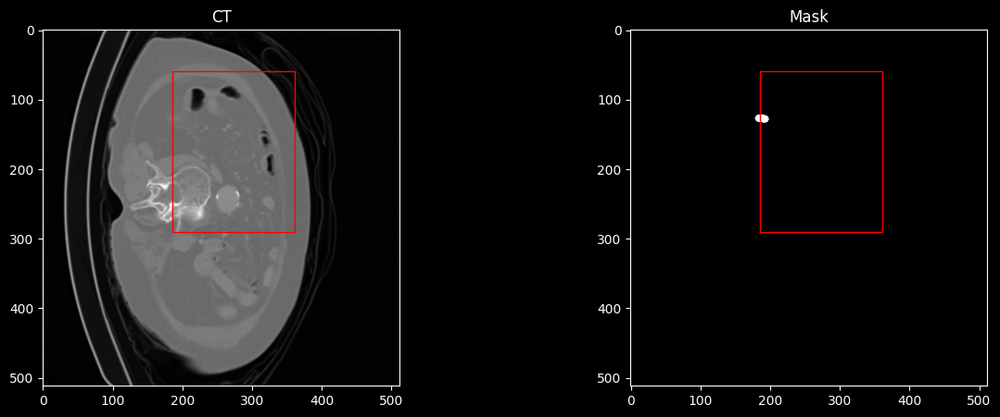

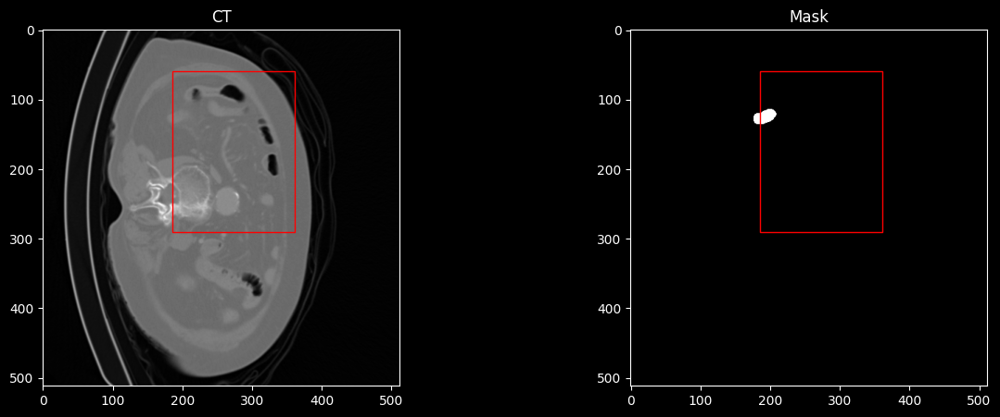

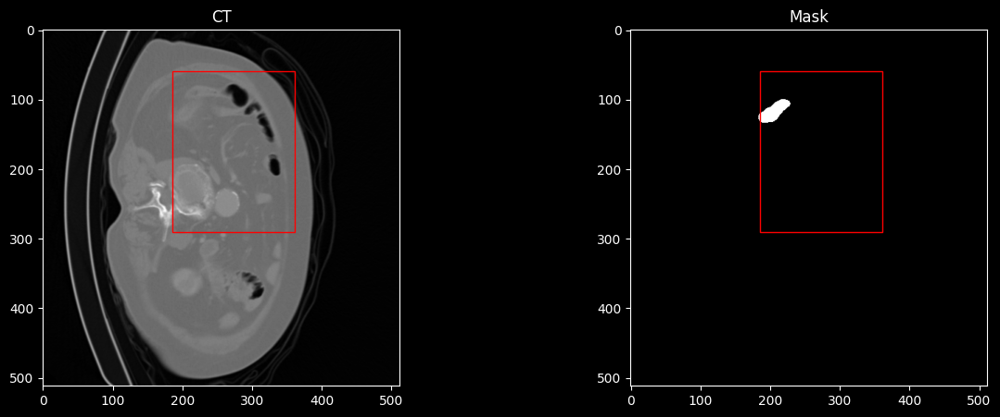

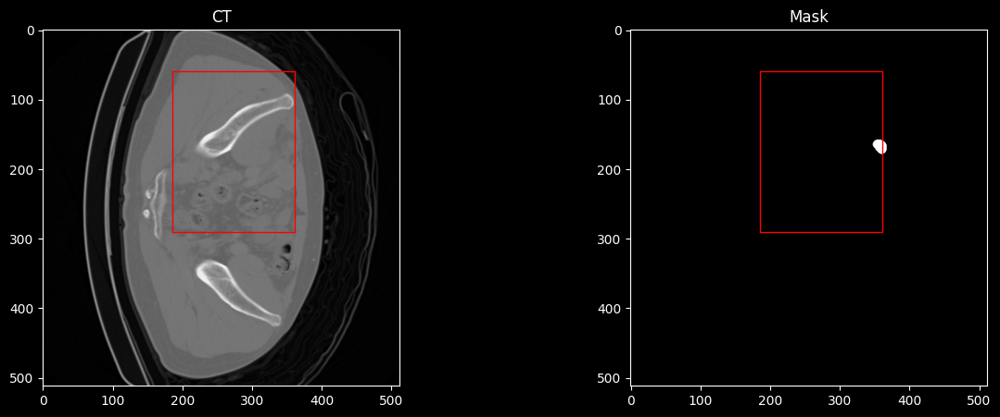

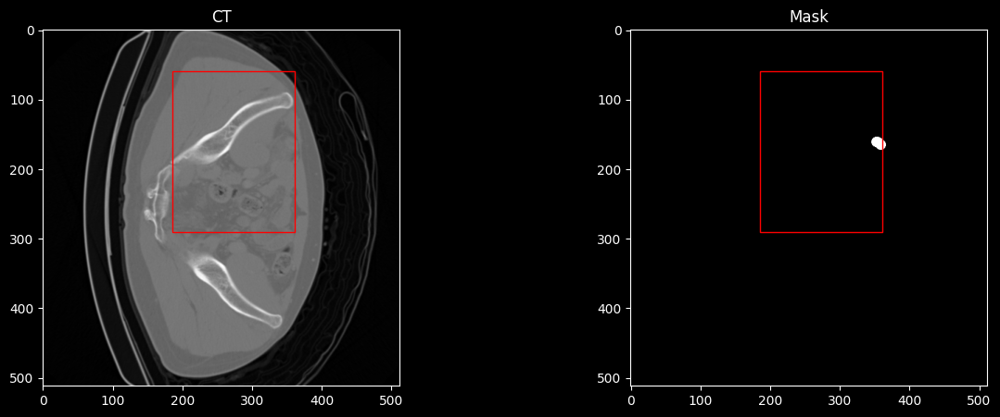

...

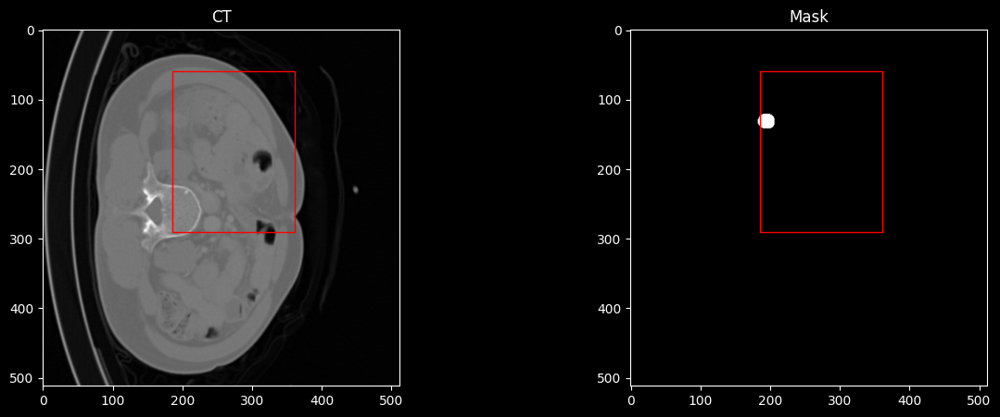

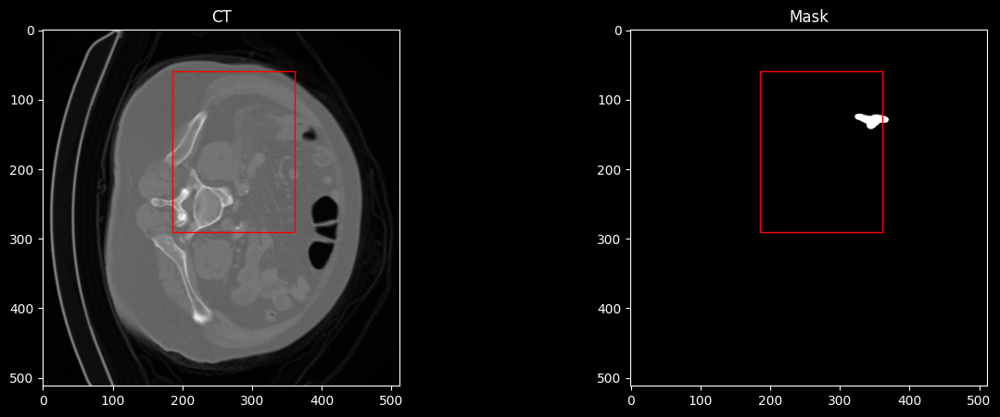

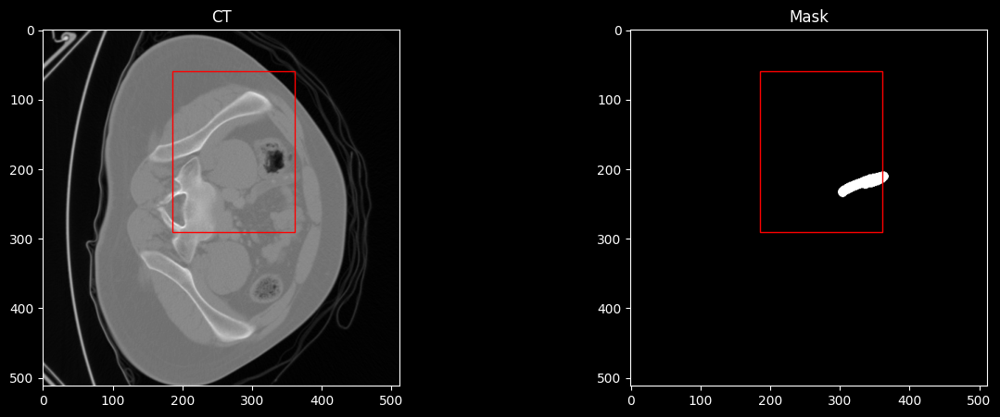

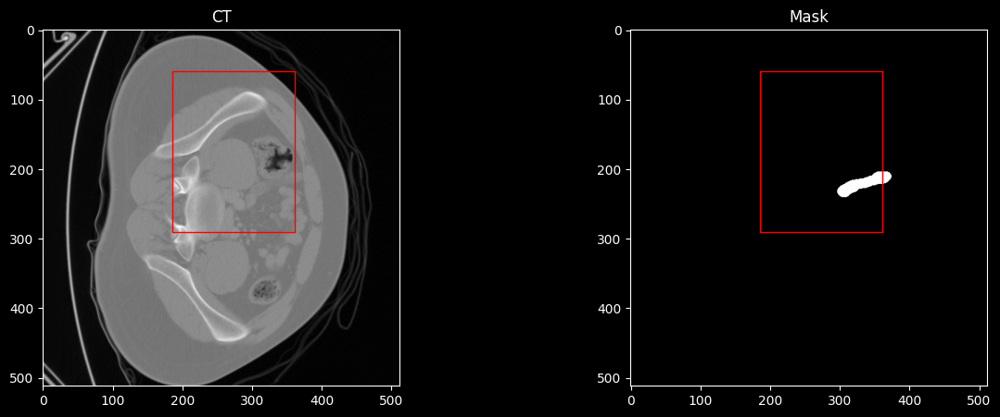

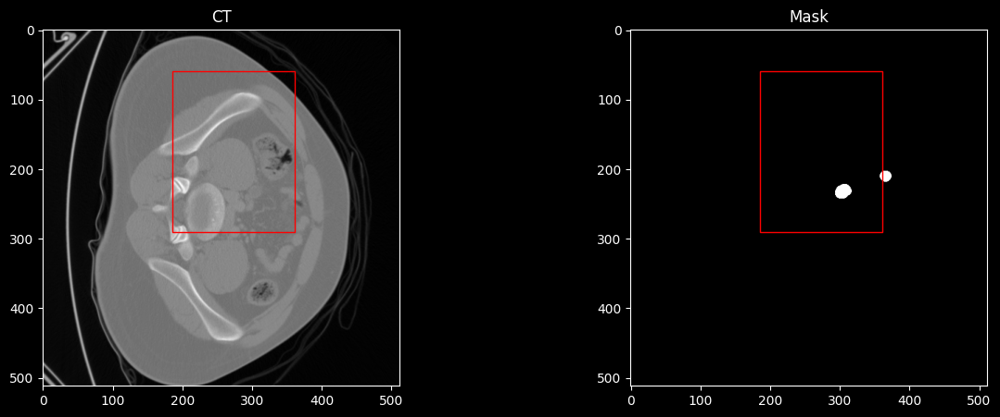

In [106]:
min_x = 185
max_x = 361
min_y = 59
max_y = 291

for idx, (id, label) in tqdm(
    enumerate(zip(trainVal["id"], trainVal["scan-level label"]))
):
    if label == 0:
        continue
    filepath_sample = f"../data/1_Train,Valid_Image/{id}.nii.gz"
    sample = nib.load(filepath_sample)
    sample = np.asanyarray(sample.dataobj)
    filepath_mask = f"../data/2_Train,Valid_Mask/{id}_label.nii.gz"
    mask = nib.load(filepath_mask)
    mask = np.asanyarray(mask.dataobj)

    for slice_i in range(mask.shape[2]):
        zero_pixels = np.where(mask[:, :, slice_i] != 0)
        if len(zero_pixels[0]) == 0:
            continue
        c_min_y, c_min_x = np.min(zero_pixels, axis=1)
        c_max_y, c_max_x = np.max(zero_pixels, axis=1)

        if c_min_x < min_x or c_max_x > max_x or c_min_y < min_y or c_max_y > max_y:
            rect = patches.Rectangle(
                (min_x, min_y),
                max_x - min_x,
                max_y - min_y,
                linewidth=1,
                edgecolor="r",
                facecolor="none",
            )
            rect2 = patches.Rectangle(
                (min_x, min_y),
                max_x - min_x,
                max_y - min_y,
                linewidth=1,
                edgecolor="r",
                facecolor="none",
            )
            fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

            ax1.imshow(sample[:, :, slice_i], cmap="gray")
            ax1.add_patch(rect)
            ax1.set_title("CT")

            ax2.imshow(mask[:, :, slice_i], cmap="gray")
            ax2.add_patch(rect2)
            ax2.set_title("Mask")

            plt.savefig(
                f"./outliers/{id}_{slice_i}.png", format="png", bbox_inches="tight"
            )

### Mask Slice index distribution


In [20]:
z_t = []
z_b = []
z_avg = []

for idx, id in tqdm(enumerate(trainVal["id"])):
    filepath_mask = f"../data/2_Train,Valid_Mask/{id}_label.nii.gz"
    mask = nib.load(filepath_mask)
    mask = np.asanyarray(mask.dataobj)

    mask_found = False
    last_found = 0
    for slice_i in range(mask.shape[2]):
        zero_pixels = np.where(
            mask[:, :, slice_i] != 0
        )  # 一個陣列包含非零元素的行索引，第二個陣列包含非零元素的列索引
        if len(zero_pixels[0]) != 0:
            if not mask_found:
                mask_found = True
                z_t.append(slice_i + 1)
            last_found = slice_i + 1
    if mask_found:
        z_b.append(last_found)
        z_avg.append(last_found - z_t[-1])

print(len(z_t), len(z_b), len(z_avg))

1000it [02:16,  7.35it/s]

500 500 500


### Number of Slice


Text(0.5, 1.0, 'Distribution of number of slice')

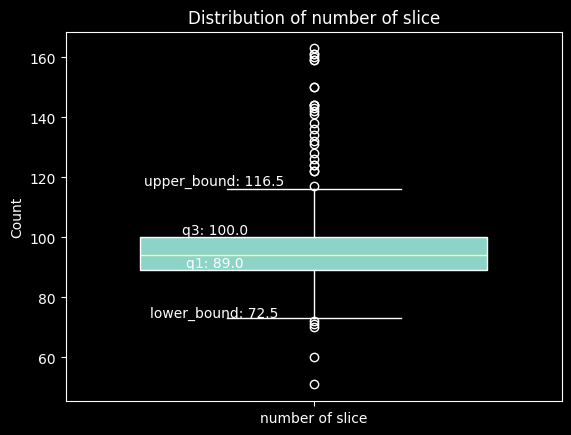

In [90]:
plt.boxplot(
    slice_count, vert=True, widths=0.7, patch_artist=True, labels=["number of slice"]
)

# Add labels to show the number of the bound
q1, q3 = np.percentile(slice_count, [25, 75])
iqr = q3 - q1
lower_bound = q1 - 1.5 * iqr
upper_bound = q3 + 1.5 * iqr
plt.text(0.8, q1, f"q1: {q1}", horizontalalignment="center", verticalalignment="bottom")
plt.text(0.8, q3, f"q3: {q3}", horizontalalignment="center", verticalalignment="bottom")
plt.text(
    0.8,
    lower_bound,
    f"lower_bound: {lower_bound}",
    horizontalalignment="center",
    verticalalignment="bottom",
)
plt.text(
    0.8,
    upper_bound,
    f"upper_bound: {upper_bound}",
    horizontalalignment="center",
    verticalalignment="bottom",
)

median = np.median(slice_count)
mean = np.mean(slice_count)
plt.scatter(idx + 1, median, color='red', marker='D', label=f'Median: {median}')
plt.scatter(idx + 1, mean, color='blue', marker='o', label=f'Mean: {mean}')

# Add labels and title
# plt.xlabel('Z-axis Slice')
plt.ylabel("Count")
plt.title("Distribution of number of slice")

Text(0.5, 1.0, 'Distribution of mask slice')

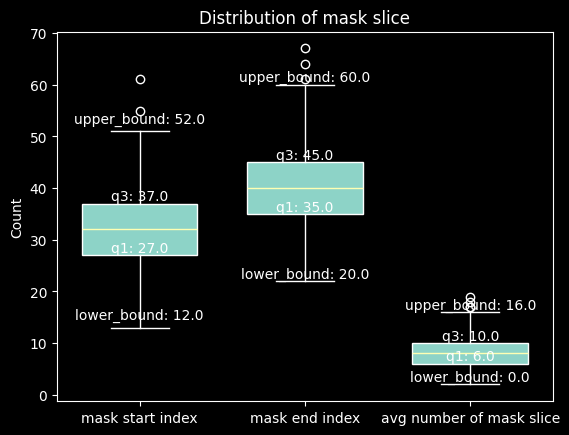

In [26]:
plt.boxplot(
    [z_t, z_b, z_avg],
    vert=True,
    widths=0.7,
    patch_artist=True,
    labels=["mask start index", "mask end index", "avg number of mask slice"],
)

for i, data in enumerate([z_t, z_b, z_avg]):
    q1, q3 = np.percentile(data, [25, 75])
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    plt.text(
        i + 1,
        q1,
        f"q1: {q1}",
        horizontalalignment="center",
        verticalalignment="bottom",
    )
    plt.text(
        i + 1,
        q3,
        f"q3: {q3}",
        horizontalalignment="center",
        verticalalignment="bottom",
    )
    plt.text(
        i + 1,
        lower_bound + 2,
        f"lower_bound: {lower_bound}",
        horizontalalignment="center",
        verticalalignment="bottom",
    )
    plt.text(
        i + 1,
        upper_bound,
        f"upper_bound: {upper_bound}",
        horizontalalignment="center",
        verticalalignment="bottom",
    )

# Add labels and title
# plt.xlabel('Z-axis Slice')
plt.ylabel("Count")
plt.title("Distribution of mask slice")

### View pixel values range


In [45]:
filepath_mask = f"../data/1_Train,Valid_Image/Zx00AD16F8B97A53DE6E7CFE260BDF122F0E655659A3DF1628.nii.gz"
sample = nib.load(filepath_mask)
sample = np.asanyarray(sample.dataobj)

print(sample.min(), sample.max())

-1024.0 1600.0


192 210 229 249


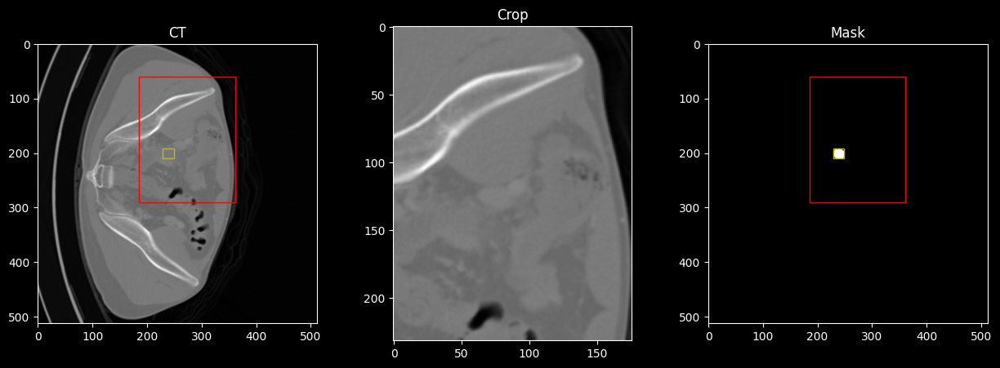

In [49]:
# [59.5, 75.0, 185.5, 220.5] [247.5, 291.0, 341.5, 360.5]
min_x = 185
max_x = 361
min_y = 59
max_y = 291

id = "Zx00AD16F8B97A53DE6E7CFE260BDF122F0E655659A3DF1628"
filepath_sample = f"../data/1_Train,Valid_Image/{id}.nii.gz"
filepath_mask = f"../data/2_Train,Valid_Mask/{id}_label.nii.gz"
sample = nib.load(filepath_sample)
sample = np.asanyarray(sample.dataobj)
sample_crop = sample[min_y:max_y, min_x:max_x, :]

mask = nib.load(filepath_mask)
mask = np.asanyarray(mask.dataobj)

#
mask2 = np.where(mask[:, :, 30] != 0, 255, 0)
# bounding box
zero_pixels = np.where(mask2 == 255)
min_y_r, min_x_r = np.min(zero_pixels, axis=1)
max_y_r, max_x_r = np.max(zero_pixels, axis=1)
print(min_y_r, max_y_r, min_x_r, max_x_r)

# plot
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 5))
rect = patches.Rectangle(
    (min_x, min_y),
    max_x - min_x,
    max_y - min_y,
    linewidth=1,
    edgecolor="r",
    facecolor="none",
)
rect2 = patches.Rectangle(
    (min_x, min_y),
    max_x - min_x,
    max_y - min_y,
    linewidth=1,
    edgecolor="r",
    facecolor="none",
)
rect_r = patches.Rectangle(
    (min_x_r, min_y_r),
    max_x_r - min_x_r,
    max_y_r - min_y_r,
    linewidth=1,
    edgecolor="y",
    facecolor="none",
)
rect2_r = patches.Rectangle(
    (min_x_r, min_y_r),
    max_x_r - min_x_r,
    max_y_r - min_y_r,
    linewidth=1,
    edgecolor="y",
    facecolor="none",
)
ax1.imshow(sample[:, :, 30], cmap="gray")
ax1.add_patch(rect)
ax1.add_patch(rect_r)
ax1.set_title("CT")
ax2.imshow(sample_crop[:, :, 30], cmap="gray")
ax2.set_title("Crop")
ax3.imshow(mask[:, :, 30], cmap="gray")
ax3.add_patch(rect2)
ax3.add_patch(rect2_r)
ax3.set_title("Mask")

plt.show()

133 151 44 64


Text(0.5, 1.0, 'Crop Mask')

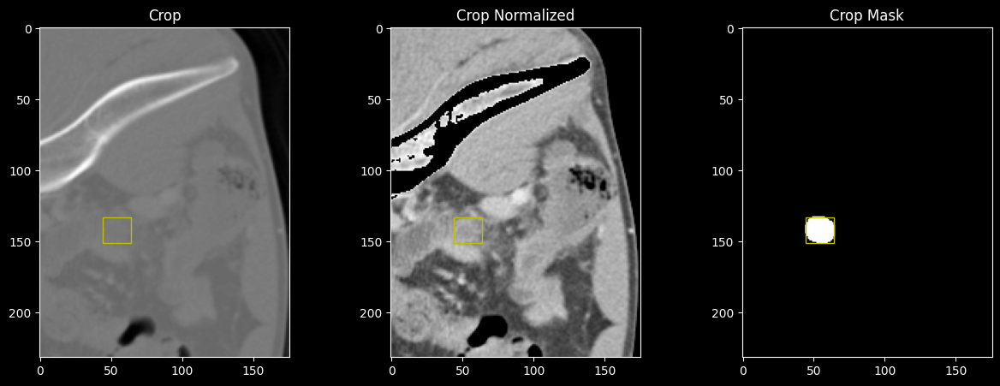

In [64]:
def normalize(sample, WL=45, WW=300, CT_min=None, CT_max=None):
    """Normalize the volume"""
    if CT_min is None:
        CT_min = WL - WW / 2
    if CT_max is None:
        CT_max = WL + WW / 2

    sample = (sample - CT_min) / (CT_max - CT_min)
    sample[sample > 1] = 0.0
    sample[sample < 0] = 0.0
    return sample


# def plot_image_and_mask(slice_index):
slice_index = 30
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 5))

mask2 = np.where(mask[min_y:max_y, min_x:max_x, :][:, :, slice_index] != 0, 255, 0)
zero_pixels = np.where(mask2 == 255)

if zero_pixels[0].size != 0:
    min_y_r, min_x_r = np.min(zero_pixels, axis=1)
    max_y_r, max_x_r = np.max(zero_pixels, axis=1)
else:
    min_y_r = min_x_r = max_y_r = max_x_r = 0

print(min_y_r, max_y_r, min_x_r, max_x_r)

rect_r = patches.Rectangle(
    (min_x_r, min_y_r),
    max_x_r - min_x_r,
    max_y_r - min_y_r,
    linewidth=1,
    edgecolor="y",
    facecolor="none",
)
rect2_r = patches.Rectangle(
    (min_x_r, min_y_r),
    max_x_r - min_x_r,
    max_y_r - min_y_r,
    linewidth=1,
    edgecolor="y",
    facecolor="none",
)
rect3_r = patches.Rectangle(
    (min_x_r, min_y_r),
    max_x_r - min_x_r,
    max_y_r - min_y_r,
    linewidth=1,
    edgecolor="y",
    facecolor="none",
)


ax1.imshow(sample_crop[:, :, slice_index], cmap="gray")
ax1.add_patch(rect_r)
ax1.set_title("Crop")
ax2.imshow(
    normalize(sample_crop[:, :, slice_index], WL=45, WW=300, CT_min=-200), cmap="gray"
)
ax2.add_patch(rect2_r)
ax2.set_title("Crop Normalized")
ax3.imshow(mask[min_y:max_y, min_x:max_x, :][:, :, slice_index], cmap="gray")
ax3.add_patch(rect3_r)
ax3.set_title("Crop Mask")


# num_slices = sample_crop.shape[2]
# slice_slider = widgets.IntSlider(
#     min=0,
#     max=num_slices - 1,
#     step=1,
#     description="Slice Index",
#     continuous_update=False,
# )
# widgets.interactive(plot_image_and_mask, slice_index=slice_slider)

In [28]:
import cv2

def find_min_area():
    area = []

    for idx, id in tqdm(enumerate(trainVal["id"])):
        filepath_mask = f"../data/2_Train,Valid_Mask/{id}_label.nii.gz"
        mask = nib.load(filepath_mask)
        mask = np.asanyarray(mask.dataobj)

        for slice_i in range(mask.shape[2]):
            zero_pixels = np.where(mask[:, :, slice_i] != 0)
            if len(zero_pixels[0]) == 0:
                continue

            # Create a binary mask
            binary_mask = np.zeros_like(mask[:, :, slice_i], dtype=np.uint8)
            binary_mask[zero_pixels] = 255

            # Find contours in the binary mask
            contours, _ = cv2.findContours(binary_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

            if not contours:
                continue

            # Find the contour with the minimum area
            min_area_contour = min(contours, key=cv2.contourArea)
            x, y, w, h = cv2.boundingRect(min_area_contour)

            area.append([(x, y, w, h), cv2.contourArea(min_area_contour), filepath_mask, slice_i])

    return area

# Assuming trainVal is defined elsewhere in your code
area = find_min_area()
area_sorted = sorted(area, key=lambda x: x[1])
len(area)


0it [00:00, ?it/s]

1000it [02:21,  7.07it/s]


4498

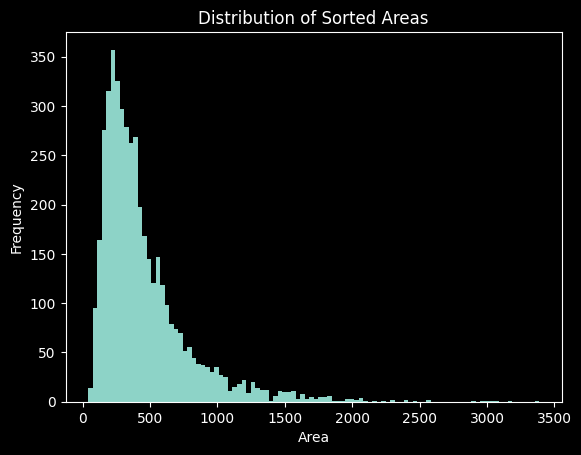

In [35]:
import matplotlib.pyplot as plt

areas = [item[1] for item in area_sorted]

plt.hist(areas, bins=100)
plt.xlabel('Area')
plt.ylabel('Frequency')
plt.title('Distribution of Sorted Areas')
plt.show()


40.5
43.5
53.5
62.5
64.0
64.0
64.5
65.0
67.0
67.5


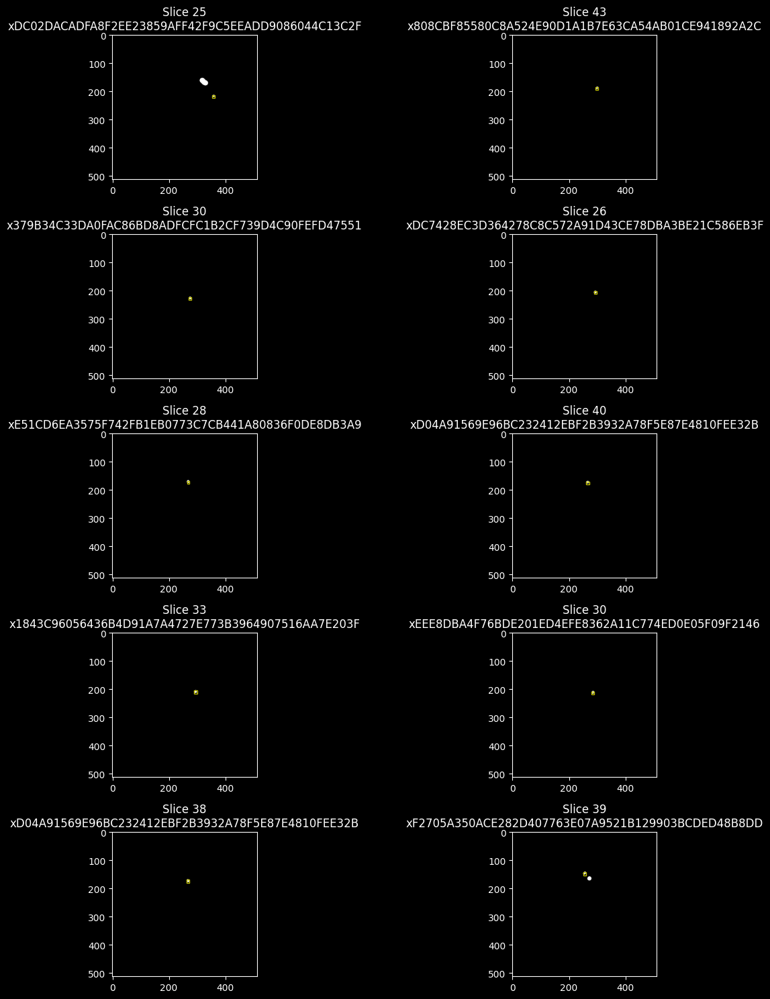

In [29]:
fig, axs = plt.subplots(5, 2, figsize=(15, 15))

for i, ax in enumerate(axs.flat):
    (x, y, w, h), area, filepath_mask, slice_i = area_sorted[i]
    print(area)
    mask = nib.load(filepath_mask)
    mask = np.asanyarray(mask.dataobj)
    ax.imshow(mask[:, :, slice_i], cmap='gray')
    ax.add_patch(patches.Rectangle((x, y), w, h, linewidth=1, edgecolor='y', facecolor='none'))
    ax.set_title(f"Slice {slice_i}\n{filepath_mask.split('Z')[-1].split('_')[0]}")

plt.tight_layout()
plt.show()
